In this task, I'm going to perform image segmentation on satellite image datasets in order to segment the areas that belong to solar panels.

For this purpose I used UNet. UNet performs very good because of the use of skip connections and the encoding decoding structure.
I have already used UNet structure for segmenting tumors and other biomedical tasks at the university.

#Importing Required Libraries

In [1]:
%%capture
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from PIL import Image
import keras.backend as K
import json

In [2]:
!pip install kaggle
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
api_token  = {"username":"zahrameskar","key":"a57dc2e4ceab130af4046ddc54cca62a"}
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)
!chmod 600 ~/.kaggle/kaggle.json

#Utility Functions

In [4]:
def resize_save_images(data_list ,data_root, is_label ):
  for label_path in data_list:
    src_path = label_path
    if is_label:
      file_name = os.path.basename(label_path).replace('_label','')
      dst_path = os.path.join(data_root,file_name)
    else:
      dst_path = os.path.join(data_root,os.path.basename(src_path))

    img = Image.open(src_path)
    new_img = img.resize( (256, 256) )
    new_img.save( dst_path[:-4]+'.png', 'png') 

In [5]:
def visualize_predicted(display_list):
    plt.figure(figsize=(6, 6))
    title = ['Input Image', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [6]:
def show_(sample_image):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize_predicted([sample_image, pred_mask])
    return pred_mask

In [7]:
def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'Actual Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [8]:
def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])

in this section we defeined dice score as a metric of calculating the overlap between the mask and the predicted mask

In [9]:
def dice_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(y_true * y_pred, axis=[1,2,3])
    union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
    return K.mean( (2. * intersection + smooth) / (union + smooth), axis=0)

In [10]:
def dice_loss(in_gt, in_pred):
    return 1-dice_coef(in_gt, in_pred)

this function creates convolutional up sampling blocks for the decoder

In [11]:
def up_sample(filters, size):
  
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    result.add(       tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',    kernel_initializer=initializer,    use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    return result

in order to find the corresponding images and labels, we create dataframes comprising of each sample stored with its unique id

In [12]:
def prepare_dataframe(data_path, name):

    solar_ids = []
    paths = []
    for dirname, _, filenames in os.walk(data_path):
        for filename in filenames:
            path = os.path.join(dirname, filename)    
            paths.append(path)

            solar_id = filename.split(".")[0]
            solar_ids.append(solar_id)

    d = {"id": solar_ids, name: paths}
    df = pd.DataFrame(data = d)
    df = df.set_index('id')
    return df

In [13]:
def display(display_list):
  
    plt.figure(figsize=(6, 6))
    title = ['Input Image', 'Actual Label', 'Predicted Label']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

we can apply augmentation to image,label pairs using various approches including using albumentation transforms keras.image functions and so on

In [14]:
def data_augmentation(solar_img, mask_img):

    if tf.random.uniform(()) > 0.5:
        solar_img = tf.image.flip_left_right(solar_img)
        mask_img = tf.image.flip_left_right(mask_img)
    if tf.random.uniform(()) > 0.2 and tf.random.uniform(()) < 0.4 :
        solar_img=tf.image.adjust_brightness(solar_img,0.2)    
        mask_img=tf.image.adjust_brightness(mask_img,0.2)    
    if tf.random.uniform(()) > 0.6 and tf.random.uniform(()) < 0.8 :
        solar_img=tf.image.adjust_contrast(solar_img,0.2)    
        mask_img=tf.image.adjust_contrast(mask_img,0.2)    
    if tf.random.uniform(()) > 0.9  :
        solar_img=tf.image.adjust_gamma(solar_img,gamma=3,gain=2)  
        mask_img=tf.image.adjust_gamma(mask_img,gamma=3,gain=2)
    if tf.random.uniform(()) <0.2:
        solar_img = tf.image.flip_up_down(solar_img)
        mask_img = tf.image.flip_up_down(mask_img)


    return solar_img, mask_img

In [15]:
def preprocessing(solar_path, mask_path):

    solar_img = tf.io.read_file(solar_path) 
    solar_img = tf.image.decode_jpeg(solar_img, channels=3)
    solar_img = tf.image.resize(solar_img, img_size)
    solar_img = tf.cast(solar_img, tf.float32) / 255.0
    
    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_png(mask_img, channels=1)
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = mask_img[:,:,:1]    
    mask_img = tf.math.sign(mask_img)
    
    return solar_img, mask_img

this function creates the dataset comprising x y values given their paths.

In [16]:
def create_dataset(df, train = False):
    if not train:
        ds = tf.data.Dataset.from_tensor_slices((df["x_path"].values, df["y_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((df["x_path"].values, df["y_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
        ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds

#Dataset Creation

I used 'Dataset for photoviltaic panel segmentation' available at "https://www.kaggle.com/datasets/salimhammadi07/solar-panel-detection-and-identification"


A photovoltaic (PV) dataset from satellite and aerial imagery. The dataset includes three groups of PV samples collected at the spatial resolution of 0.8m, 0.3m and 0.1m, namely PV08 from Gaofen-2 and Beijing-2 imagery, PV03 from aerial photography, and PV01 from UAV orthophotos. PV08 contains rooftop and ground PV samples. Ground samples in PV03 are divided into five categories according to their background land use type: shrub land, grassland, cropland, saline-alkali, and water surface. Rooftop samples in PV01 are divided into three categories according to their background roof type: flat concrete, steel tile, and brick. Data document can refer to the preprint https://essd.copernicus.org/preprints/essd-2021-270/

Apparantly pv03 stands for 0.3m resolution of the images.

In [17]:
!kaggle datasets download -d salimhammadi07/solar-panel-detection-and-identification

100% 5.19G/5.20G [01:03<00:00, 174MB/s]
100% 5.20G/5.20G [01:03<00:00, 87.5MB/s]


In [18]:
!unzip -qq solar-panel-detection-and-identification.zip

I created two folders, one for x_train and another for y_train

In [19]:
# !mkdir train
# !mkdir train_masks
image_root = '/content/train'
label_root = '/content/train_masks'
root_dir = '/content/PV03'
data_dir = os.path.join(root_dir)
img_size = (256,256)
BATCH_SIZE = 32
BUFFER_SIZE = 1000

if not os.path.isdir(image_root):
    os.mkdir(image_root)
if not os.path.isdir(label_root):
    os.mkdir(label_root)

 Using os.walk we iterate through every file and folder in the root directory to find the correspondin filenames of the samples in the dataset.
at the end we create lists comprising paths corresponding to images and labels.
os.walk returns 3 values, the current directory, list of the folders in the current directory and list of the files in the current directory.
we keep the path to every *.bmp image in the images list.

In [20]:
all_images , images , labels = list()  , list() , list()
for (dirpath, dirnames, filenames) in os.walk(data_dir):
    all_images += [os.path.join(dirpath, file) for file in filenames]

if a filename contains 'label' token, we consider this as a mask and seperate the label paths from the input image paths.

In [21]:
labels += [i for i in filter(lambda score: '_label.bmp' in score, all_images)]
images = [i for i in filter(lambda score: '_label.bmp' not in score, all_images)]

Now that we have stored the input and the output masks all at two different lists we can do some preprocessing so that we can feed the input images to the network.

In UNet, the input size of the image is 256 × 256 × 3,and the output of the Generator is a Zhangfont style image with size of 256 × 256 × 3 so we resize every sample into 256 × 256 and save them as png instead of bmp since PNG files retain their original images more accurately.
We also repeat the same steps for labels and finally store the images and the labels in the folders named train and train_masks

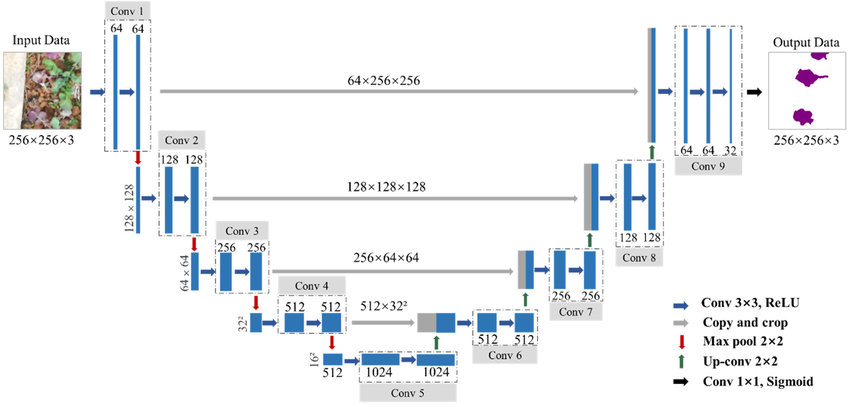

In [22]:
resize_save_images(images ,image_root, False )
resize_save_images(labels ,label_root, True )

In [23]:
print("Train set:  ", len(os.listdir("/content/train")))
print("Train masks:", len(os.listdir("/content/train_masks")))

Train set:   2308
Train masks: 2308


In [41]:
df = prepare_dataframe('/content/train', "x_path")
mask_df = prepare_dataframe('/content/train_masks', "y_path")
df["y_path"] = mask_df["y_path"]
df.head()

,x_path,y_path
id,,
PV03_329805_1196036,/content/train/PV03_329805_1196036.png,/content/train_masks/PV03_329805_1196036.png
PV03_327756_1209161,/content/train/PV03_327756_1209161.png,/content/train_masks/PV03_327756_1209161.png
PV03_329778_1196102,/content/train/PV03_329778_1196102.png,/content/train_masks/PV03_329778_1196102.png
PV03_344714_1167183,/content/train/PV03_344714_1167183.png,/content/train_masks/PV03_344714_1167183.png
PV03_331335_1208342,/content/train/PV03_331335_1208342.png,/content/train_masks/PV03_331335_1208342.png


We can see that the image path and the label path point to the same image.

Now that we have created the resized png images and stored the x,y pair pathes relative to each id, we can start the training procedure by splitting the data into train and validation. We use the train data to train the model and the validation set for hyperparameter tuning and avoding overfitting.

In [67]:
train_df, test_df = train_test_split(df, random_state=43, test_size=.1)
train_df, valid_df = train_test_split(train_df, random_state=123, test_size=.25)
train = create_dataset(train_df, train = True)
valid = create_dataset(valid_df)
test = create_dataset(test_df)

print("Train set:  ", len(train_df))
print("Validation set:  ", len(valid_df))
print("Test set:  ", len(test_df))

TRAIN_LENGTH = len(train_df)

Train set:   1557
Validation set:   520
Test set:   231


In [68]:
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)
test_dataset = test.batch(BATCH_SIZE)

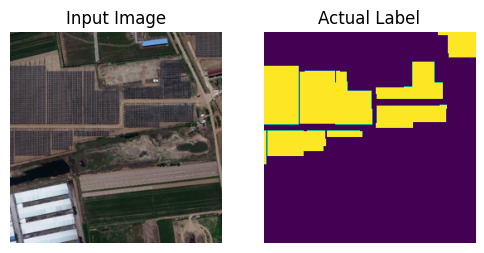

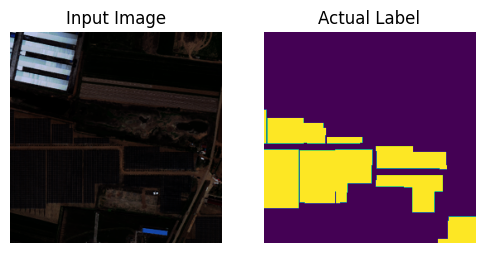

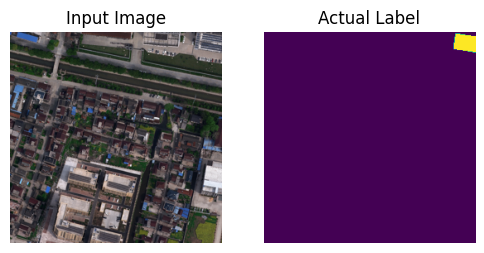

In [69]:
for i in range(3):
    for image, mask in train.take(i):
      sample_image, sample_mask = image, mask
      display([sample_image, sample_mask])

#Model Implementation

The MobileNetV2 is used for the encoder/downsampling path of the U-Net (the left half of the U). I created an instance of it


In [70]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[256, 256, 3], include_top=False)
layer_names = [     'block_1_expand_relu',  'block_3_expand_relu',   'block_6_expand_relu', 'block_13_expand_relu', 'block_16_project']
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

Then, we create the downsampling block using the base model

In [71]:
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)
down_stack.trainable = False

  Upsampling using the aformentioned up_sample function


In [72]:
up_stack = [up_sample(512, 3), up_sample(256, 3), up_sample(128, 3), up_sample(64, 3)]

In this section, we define a function which creates the model by cascading down_stack and up_stack blocks. also, we add the skip connections here.

In [73]:
def unet_model(output_channels):
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    skips = down_stack(inputs)
    x = skips[-1]
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        x = up(x)
        concat = tf.keras.layers.Concatenate()
        x = concat([x, skip])
    last = tf.keras.layers.Conv2DTranspose(       output_channels, 3, strides=2, activation='sigmoid',        padding='same')  #64x64 -> 128x128
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

finally we can create an instance of the model

In [74]:
model = unet_model(1)
model.compile(optimizer='adam', loss = dice_loss, metrics=[dice_coef,'binary_accuracy'])

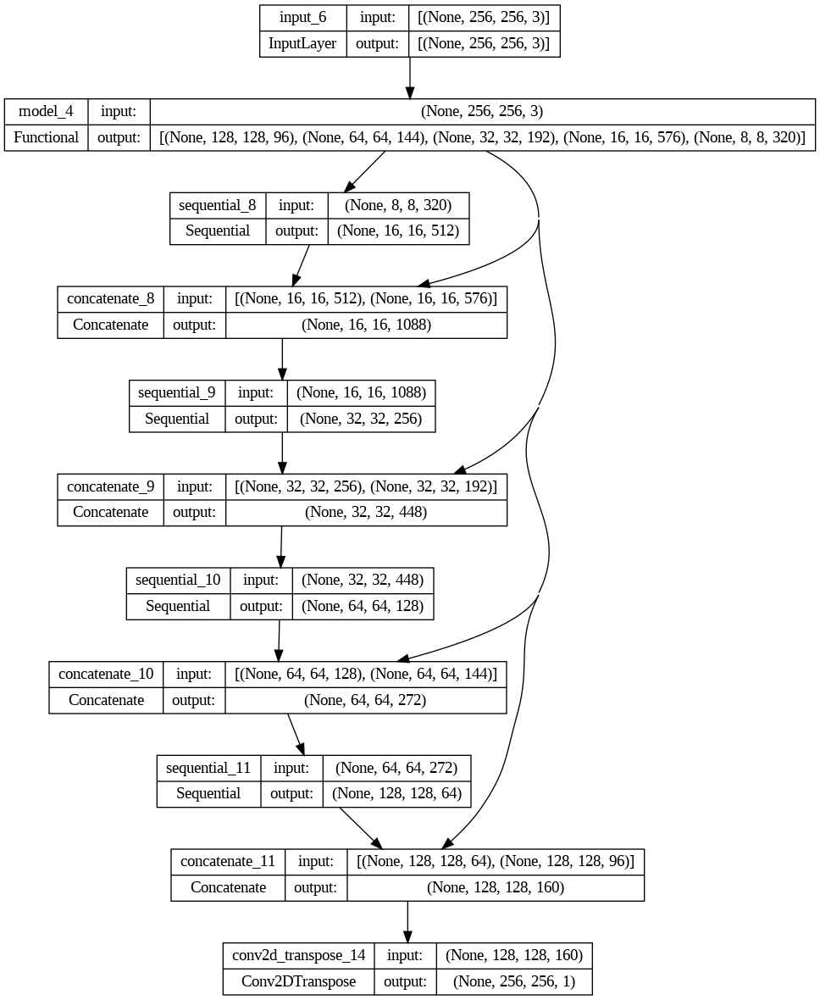

In [75]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [76]:
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_4 (Functional)           [(None, 128, 128, 9  1841984     ['input_6[0][0]']                
                                6),                                                               
                                 (None, 64, 64, 144                                               
                                ),                                                                
                                 (None, 32, 32, 192                                         

In [77]:
EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
early_stop = tf.keras.callbacks.EarlyStopping(patience=4,restore_best_weights=True)
for images, masks in train_dataset.take(1):
    for img, mask in zip(images, masks):
        sample_image = img
        sample_mask = mask
        break
class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            show_predictions(sample_image, sample_mask)

#Training

Epoch 1/30
48/48 [==============================] - 42s 471ms/step - loss: 0.4380 - dice_coef: 0.5620 - binary_accuracy: 0.3499 - val_loss: 0.2079 - val_dice_coef: 0.7927 - val_binary_accuracy: 0.9468
Epoch 2/30
48/48 [==============================] - 15s 258ms/step - loss: 0.3403 - dice_coef: 0.6601 - binary_accuracy: 0.4337 - val_loss: 0.2017 - val_dice_coef: 0.7992 - val_binary_accuracy: 0.9520
Epoch 3/30
48/48 [==============================] - 13s 275ms/step - loss: 0.3253 - dice_coef: 0.6737 - binary_accuracy: 0.4389 - val_loss: 0.2062 - val_dice_coef: 0.7941 - val_binary_accuracy: 0.9493
Epoch 4/30
1/1 [==============================] - 1s 912ms/step


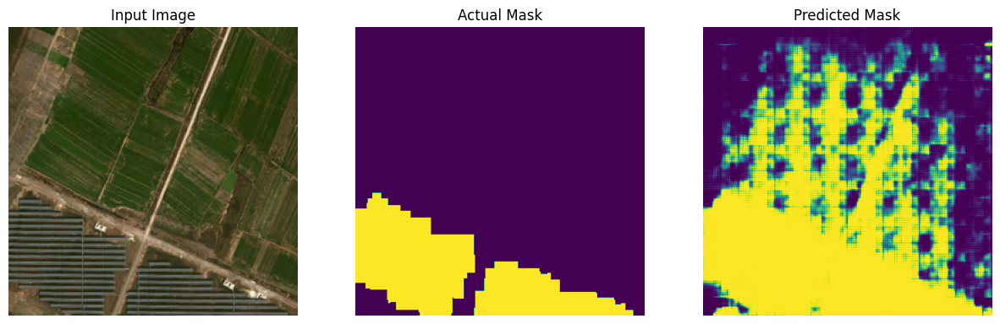

Epoch 5/30
48/48 [==============================] - 13s 269ms/step - loss: 0.3120 - dice_coef: 0.6879 - binary_accuracy: 0.4344 - val_loss: 0.2013 - val_dice_coef: 0.7984 - val_binary_accuracy: 0.9478
Epoch 6/30
48/48 [==============================] - 12s 251ms/step - loss: 0.3071 - dice_coef: 0.6930 - binary_accuracy: 0.4347 - val_loss: 0.1885 - val_dice_coef: 0.8140 - val_binary_accuracy: 0.9541
Epoch 7/30
48/48 [==============================] - 13s 266ms/step - loss: 0.3032 - dice_coef: 0.6971 - binary_accuracy: 0.4371 - val_loss: 0.2118 - val_dice_coef: 0.7882 - val_binary_accuracy: 0.9450
Epoch 8/30
48/48 [==============================] - 13s 272ms/step - loss: 0.3073 - dice_coef: 0.6919 - binary_accuracy: 0.4360 - val_loss: 0.1859 - val_dice_coef: 0.8157 - val_binary_accuracy: 0.9544
Epoch 9/30
1/1 [==============================] - 0s 25ms/step


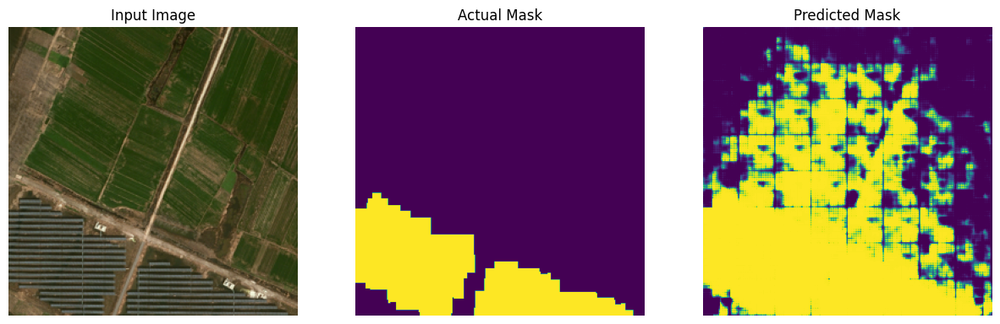

Epoch 10/30
48/48 [==============================] - 13s 270ms/step - loss: 0.3029 - dice_coef: 0.6969 - binary_accuracy: 0.4277 - val_loss: 0.1838 - val_dice_coef: 0.8183 - val_binary_accuracy: 0.9560
Epoch 11/30
48/48 [==============================] - 13s 278ms/step - loss: 0.2969 - dice_coef: 0.7029 - binary_accuracy: 0.4346 - val_loss: 0.1798 - val_dice_coef: 0.8218 - val_binary_accuracy: 0.9554
Epoch 12/30
48/48 [==============================] - 13s 264ms/step - loss: 0.3012 - dice_coef: 0.6991 - binary_accuracy: 0.4307 - val_loss: 0.1805 - val_dice_coef: 0.8212 - val_binary_accuracy: 0.9559
Epoch 13/30
48/48 [==============================] - 12s 251ms/step - loss: 0.2861 - dice_coef: 0.7136 - binary_accuracy: 0.4460 - val_loss: 0.2005 - val_dice_coef: 0.7994 - val_binary_accuracy: 0.9489
Epoch 14/30
1/1 [==============================] - 0s 27ms/step


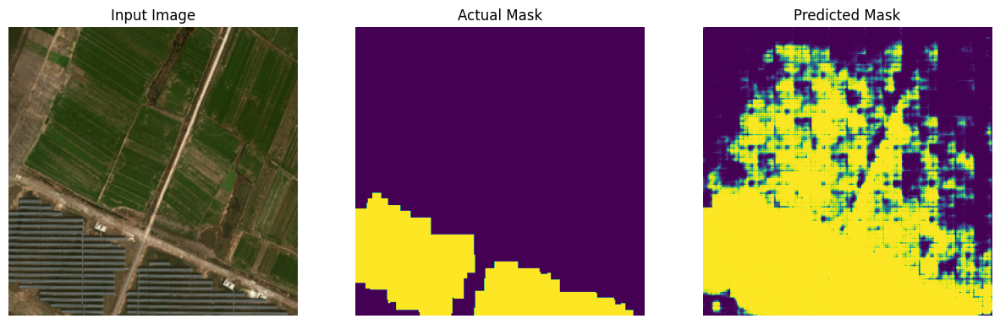

Epoch 15/30
48/48 [==============================] - 12s 250ms/step - loss: 0.2949 - dice_coef: 0.7053 - binary_accuracy: 0.4357 - val_loss: 0.1772 - val_dice_coef: 0.8241 - val_binary_accuracy: 0.9568
Epoch 16/30
48/48 [==============================] - 13s 266ms/step - loss: 0.2898 - dice_coef: 0.7098 - binary_accuracy: 0.4342 - val_loss: 0.2067 - val_dice_coef: 0.7932 - val_binary_accuracy: 0.9465
Epoch 17/30
48/48 [==============================] - 12s 259ms/step - loss: 0.2885 - dice_coef: 0.7109 - binary_accuracy: 0.4332 - val_loss: 0.1884 - val_dice_coef: 0.8133 - val_binary_accuracy: 0.9522
Epoch 18/30
48/48 [==============================] - 12s 247ms/step - loss: 0.3060 - dice_coef: 0.6946 - binary_accuracy: 0.4289 - val_loss: 0.1850 - val_dice_coef: 0.8159 - val_binary_accuracy: 0.9541
Epoch 19/30
1/1 [==============================] - 0s 44ms/step


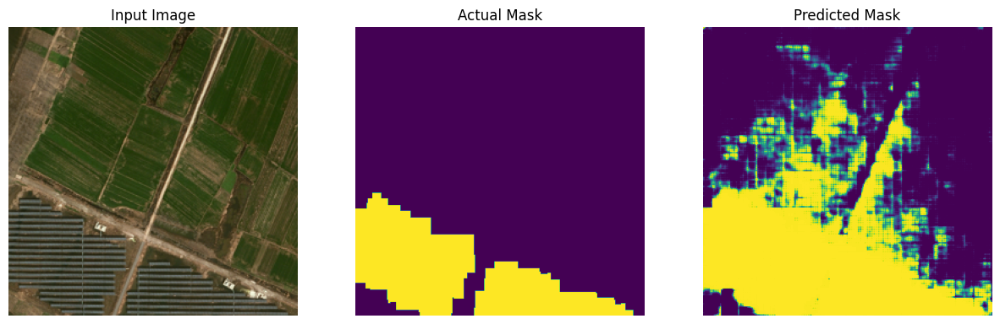

Epoch 20/30
48/48 [==============================] - 13s 277ms/step - loss: 0.2893 - dice_coef: 0.7103 - binary_accuracy: 0.4350 - val_loss: 0.1952 - val_dice_coef: 0.8054 - val_binary_accuracy: 0.9514
Epoch 21/30
48/48 [==============================] - 12s 247ms/step - loss: 0.2891 - dice_coef: 0.7103 - binary_accuracy: 0.4350 - val_loss: 0.1808 - val_dice_coef: 0.8203 - val_binary_accuracy: 0.9552
Epoch 22/30
48/48 [==============================] - 13s 268ms/step - loss: 0.2859 - dice_coef: 0.7134 - binary_accuracy: 0.4495 - val_loss: 0.1786 - val_dice_coef: 0.8234 - val_binary_accuracy: 0.9559
Epoch 23/30
48/48 [==============================] - 12s 260ms/step - loss: 0.2910 - dice_coef: 0.7082 - binary_accuracy: 0.4243 - val_loss: 0.1910 - val_dice_coef: 0.8101 - val_binary_accuracy: 0.9533


In [78]:
model_history = model.fit(train_dataset, epochs=EPOCHS, steps_per_epoch=STEPS_PER_EPOCH, validation_data=valid_dataset, callbacks=[DisplayCallback(), early_stop]) 
model.save_weights("model.h5")


High Bias is a characteristic of an underfitted model and we would observe low accuracies for both train and validation set.

High Variance is a characterisitic of an overfitted model and we would observe high accuracy for train set and low for validation set.


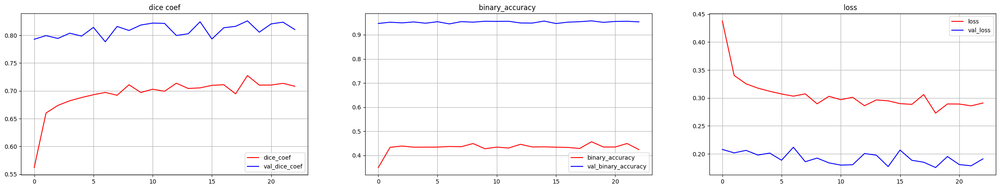

In [79]:
fig, axis = plt.subplots(1, 3, figsize=(30, 5))
axis[0].plot(model_history.history["dice_coef"], color='r', label = 'dice_coef')
axis[0].plot(model_history.history["val_dice_coef"], color='b', label = 'val_dice_coef')
axis[0].set_title('dice coef')
axis[0].legend()
axis[0].grid()
axis[1].plot(model_history.history["binary_accuracy"], color='r', label = 'binary_accuracy')
axis[1].plot(model_history.history["val_binary_accuracy"], color='b', label = 'val_binary_accuracy')
axis[1].set_title('binary_accuracy ')
axis[1].legend()
axis[1].grid()
axis[2].plot(model_history.history["loss"], color='r', label = 'loss')
axis[2].plot(model_history.history["val_loss"], color='b', label = 'val_loss')
axis[2].set_title('loss  ')
axis[2].legend()
axis[2].grid()

#Plotting Model Predictions

## on validation data

1/1 [==============================] - 0s 26ms/step


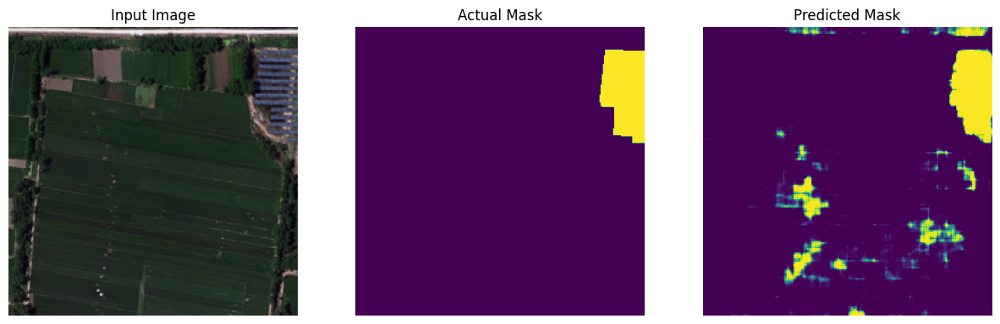

1/1 [==============================] - 0s 26ms/step


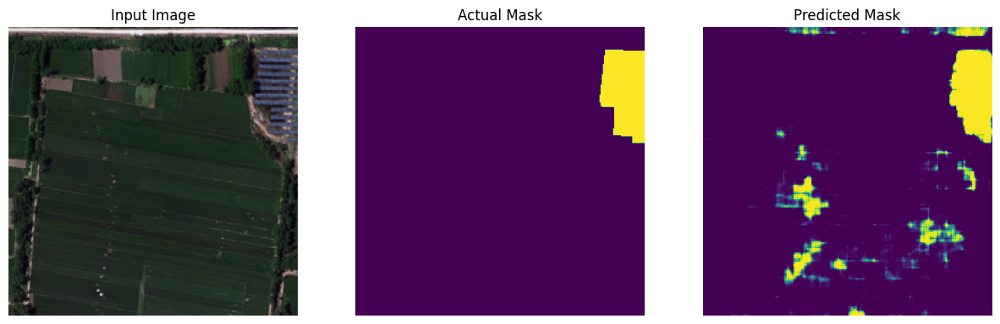

1/1 [==============================] - 0s 46ms/step


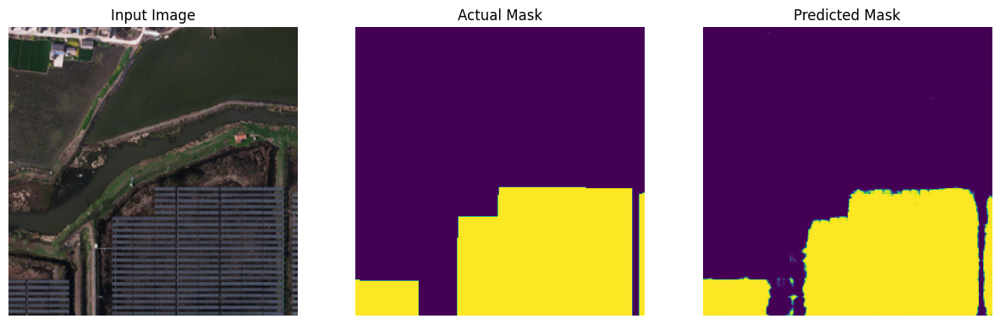

1/1 [==============================] - 0s 26ms/step


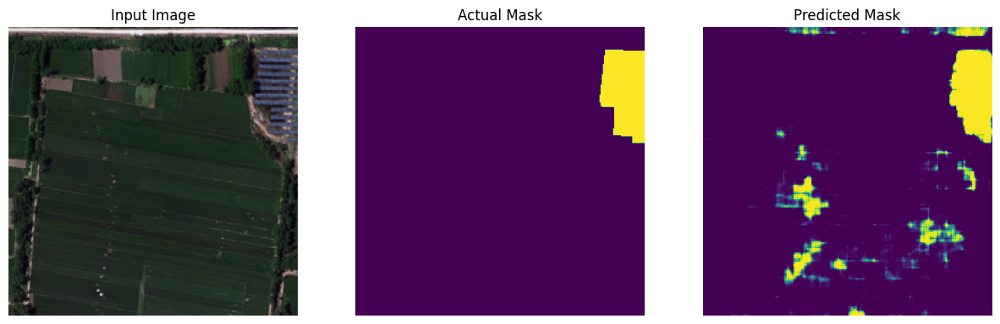

1/1 [==============================] - 0s 44ms/step


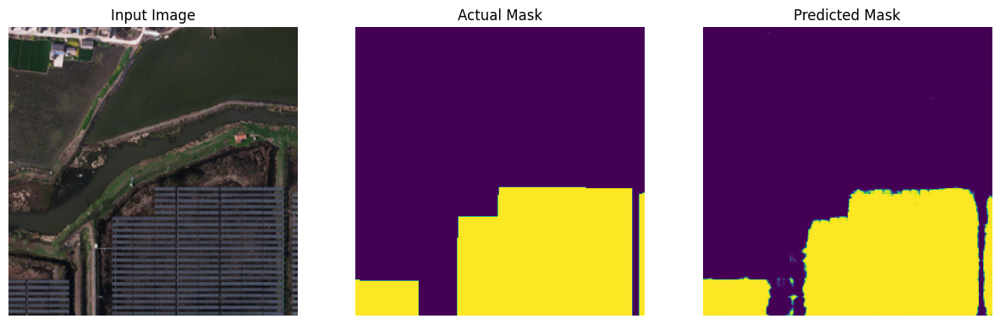

1/1 [==============================] - 0s 30ms/step


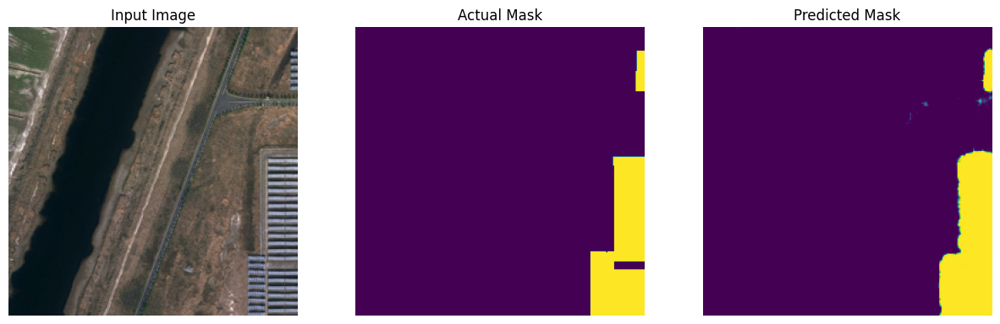

1/1 [==============================] - 0s 26ms/step


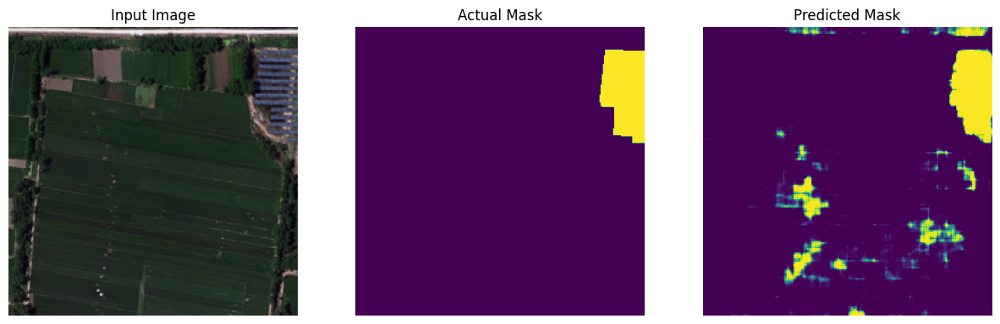

1/1 [==============================] - 0s 47ms/step


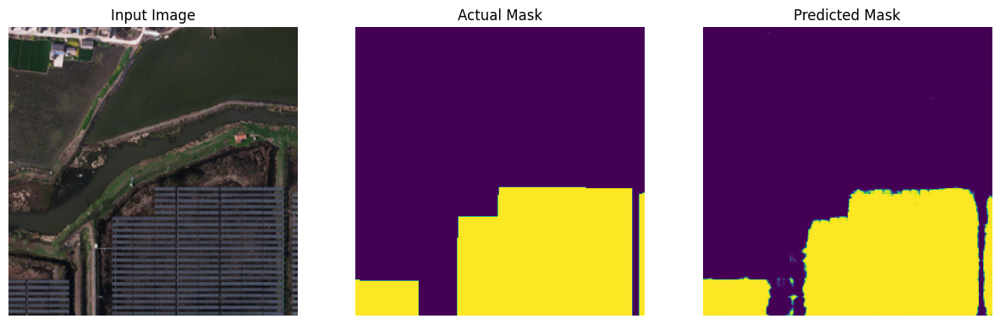

1/1 [==============================] - 0s 46ms/step


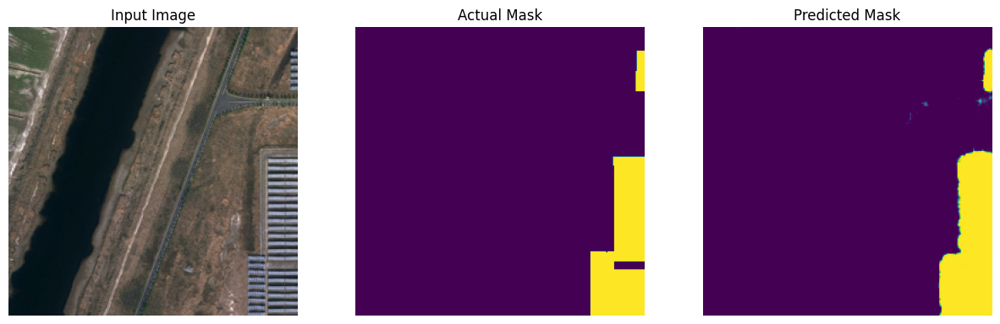

1/1 [==============================] - 0s 53ms/step


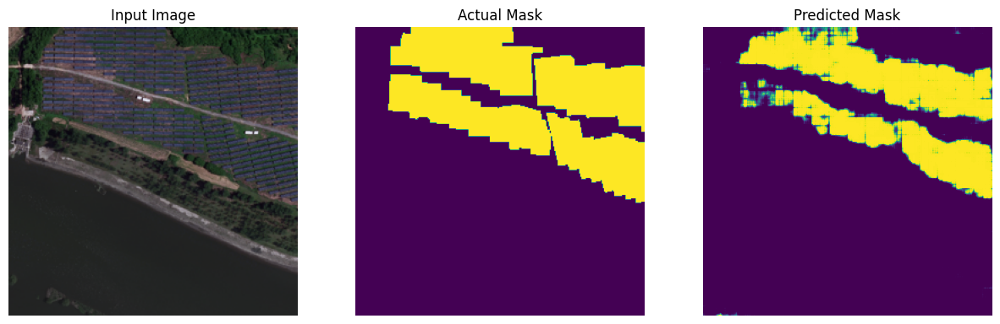

In [61]:
for i in range(5):
    for image, mask in valid.take(i):
        sample_image, sample_mask = image, mask
        show_predictions(sample_image, sample_mask)

## on test data

1/1 [==============================] - 0s 38ms/step


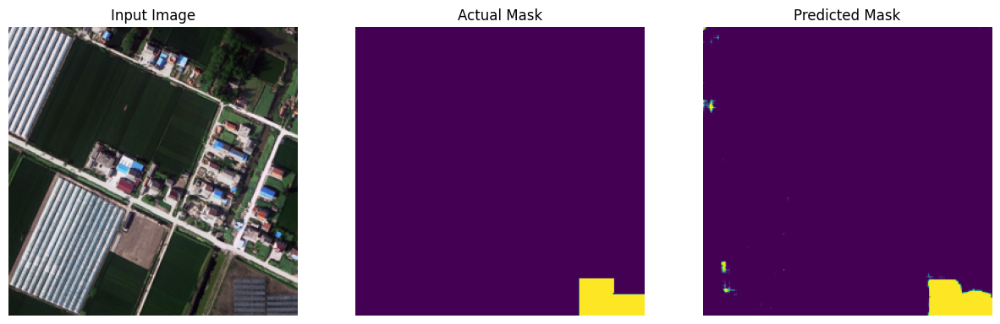

1/1 [==============================] - 0s 24ms/step


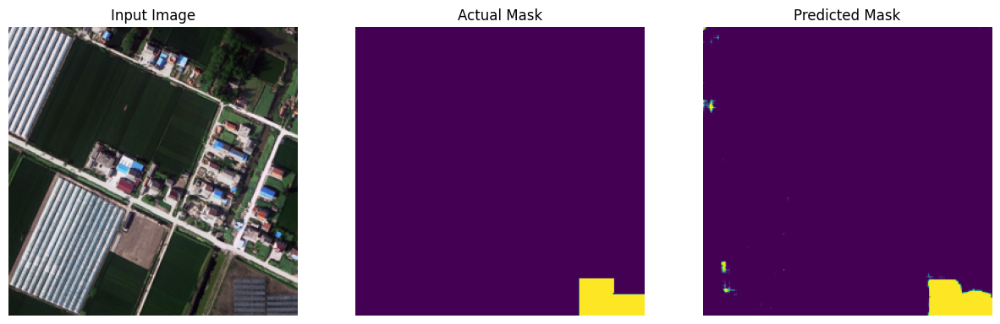

1/1 [==============================] - 0s 42ms/step


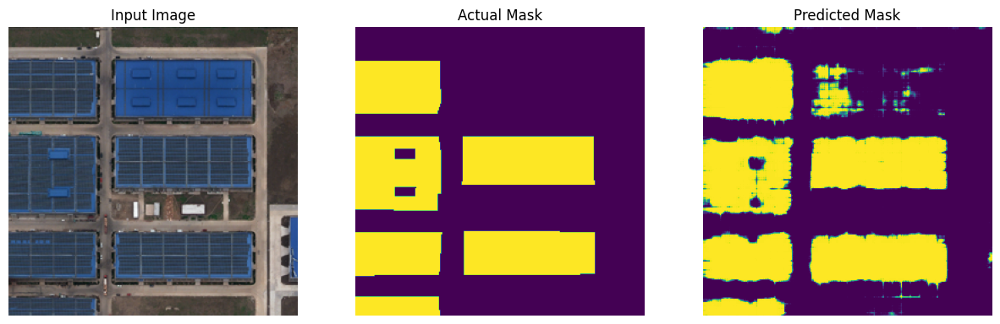

1/1 [==============================] - 0s 28ms/step


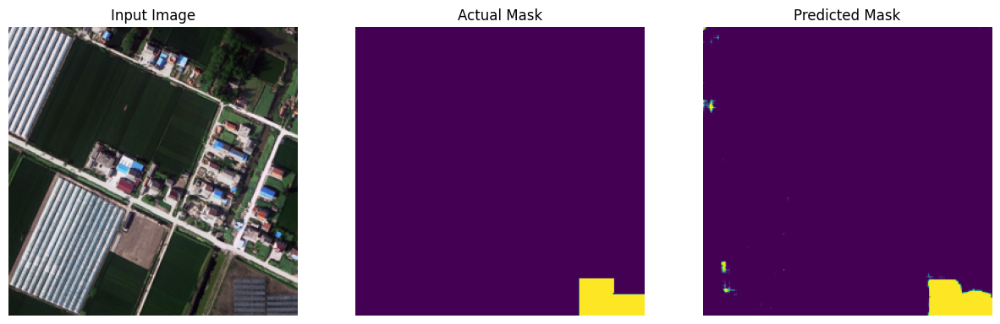

1/1 [==============================] - 0s 47ms/step


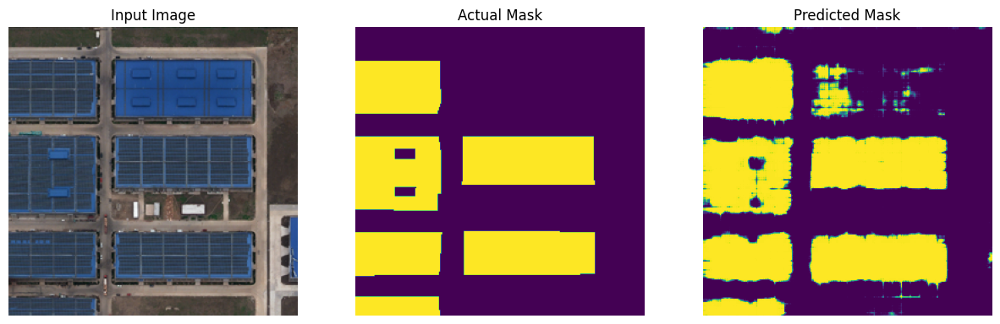

1/1 [==============================] - 0s 54ms/step


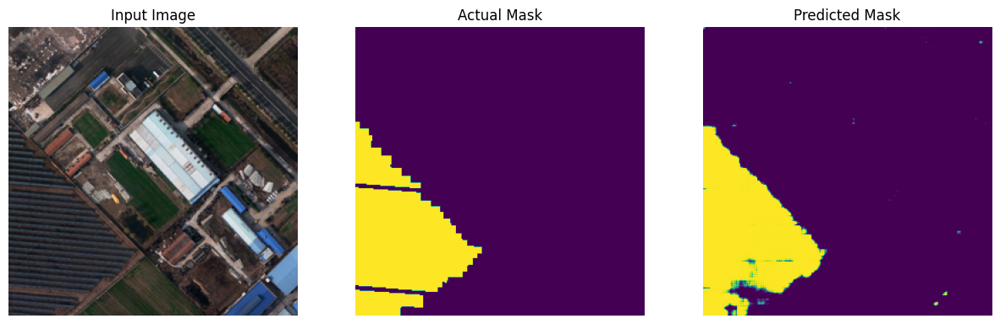

1/1 [==============================] - 0s 35ms/step


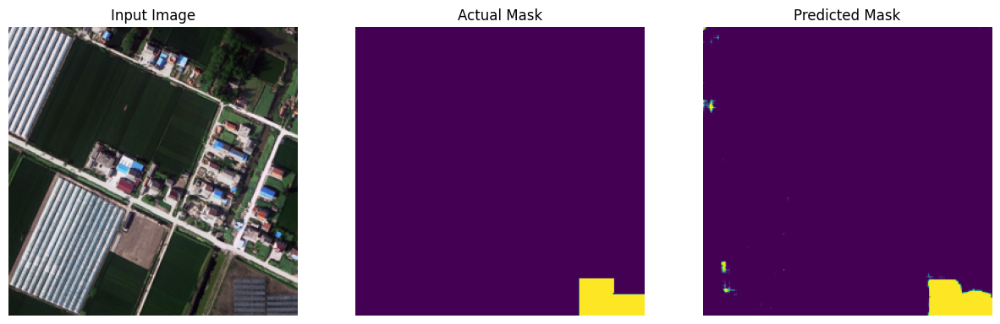

1/1 [==============================] - 0s 60ms/step


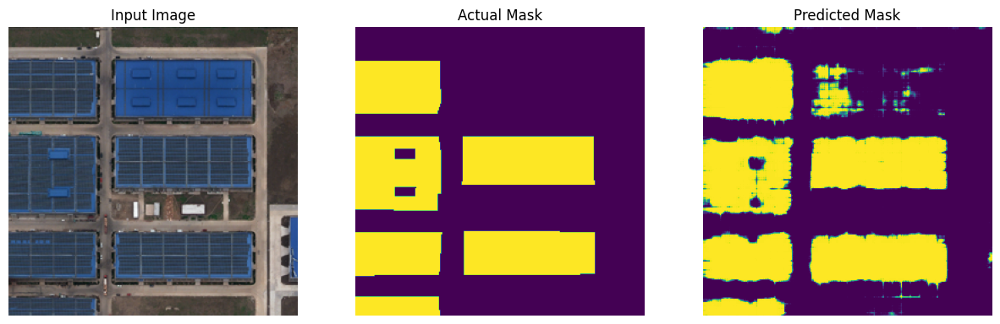

1/1 [==============================] - 0s 55ms/step


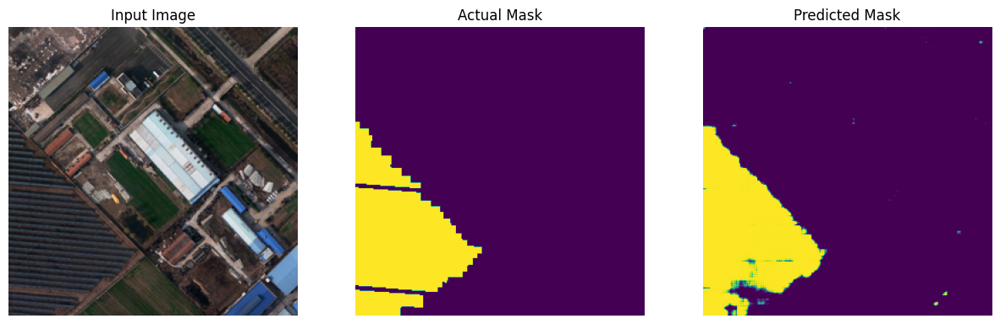

1/1 [==============================] - 0s 60ms/step


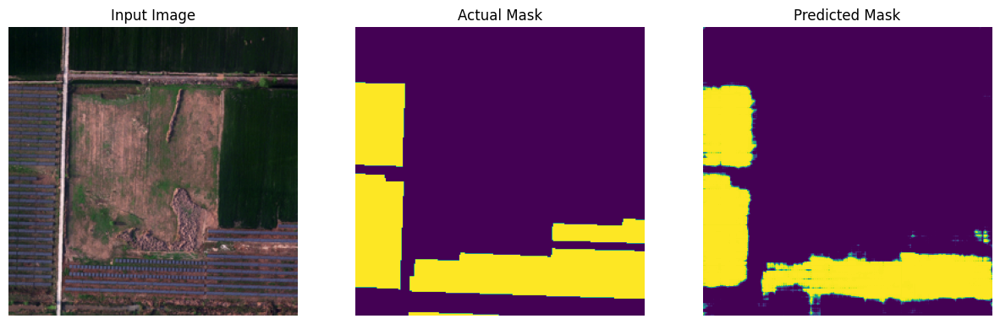

In [80]:
for i in range(5):
    for image, mask in test.take(i):
        sample_image, sample_mask = image, mask
        show_predictions(sample_image, sample_mask)

## on random files from the datset folder

1/1 [==============================] - 0s 40ms/step


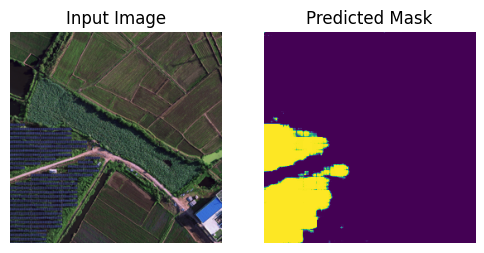

1/1 [==============================] - 0s 27ms/step


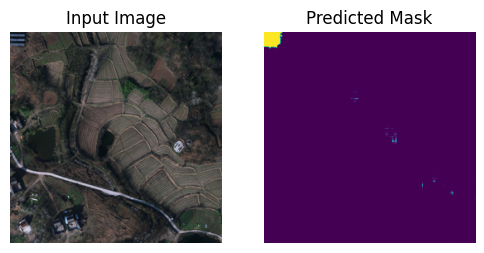

1/1 [==============================] - 0s 30ms/step


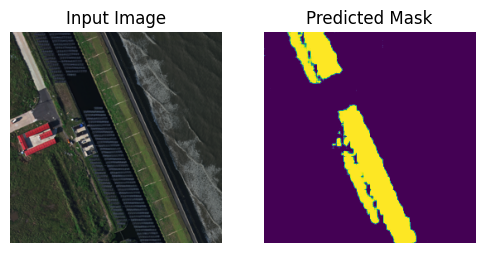

1/1 [==============================] - 0s 34ms/step


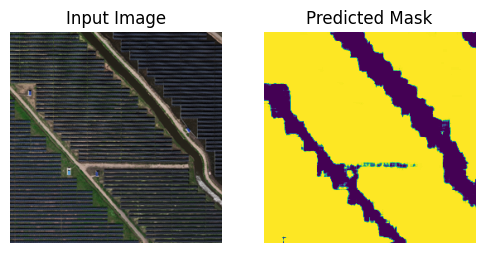

1/1 [==============================] - 0s 31ms/step


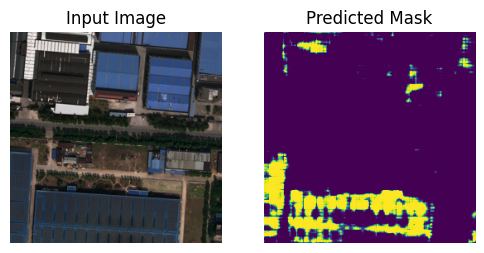

In [81]:
paths  = [ '/content/PV03/PV03_Ground_Shrubwood/PV03_319383_1194262.bmp' ,  '/content/PV03/PV03_Ground_Grassland/PV03_324751_1189196.bmp' ,  '/content/PV03/PV03_Ground_SalineAlkali/PV03_318954_1218619.bmp', '/content/PV03/PV03_Ground_Cropland/PV03_318153_1207800.bmp', '/content/train/PV03_316370_1203802.png']
for path in paths :
  sample_image = Image.open(path)
  sample_image = sample_image.resize((256,256))
  np_sample_image = np.array(sample_image.convert("RGB"))
  np_sample_image = tf.cast(np_sample_image, tf.float32) / 255.0
  pred_mask = show_(np_sample_image)